In [1]:
import json
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from sklearn.pipeline import make_pipeline
from sklearn import preprocessing
# from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils import shuffle

from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from collections import Counter

import warnings # supress warnings
warnings.filterwarnings('ignore')

# Read Data

In [2]:
df = pd.read_csv('filted_nv_2018.csv')
df_19 = pd.read_csv('filted_nv_2019.csv')
sentiment_18 = pd.read_csv('sentiment_2018.csv')
sentiment_19 = pd.read_csv('sentiment_2019.csv',engine='python')

In [3]:
df.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0_x,review_id,user_id,business_id,stars_r,useful_r,funny_r,...,cool_u,elite,compliment_cute,friends,compliment_cool,compliment_list,compliment_writer,compliment_more,compliment_note,year
0,52,2723,546842,658031,ZRQ2tICAAx9jCN3518sdTQ,NfU0zDaTMEQ4-X9dbQWd9A,Y55vx2Bj9dREg_e6UdZ_cw,4,13,4,...,8657,"2010,2011,2012,2013,2014,2015,2016,2017,2018",61,"1AdcjipaxjJxbLM1eJJTUw, an8CO22sgu9tp8viXMdoAw...",800,36,364,60,569,2018
1,61,2889,4695547,4364865,lm56cVulmyP7Vk_XmOK7iA,NfU0zDaTMEQ4-X9dbQWd9A,46zwhZduYYqI2pKQyrd1Pg,2,21,2,...,8657,"2010,2011,2012,2013,2014,2015,2016,2017,2018",61,"1AdcjipaxjJxbLM1eJJTUw, an8CO22sgu9tp8viXMdoAw...",800,36,364,60,569,2018
2,64,2914,5422747,5461100,p_v6XHVHCflxykC1v_8Dnw,NfU0zDaTMEQ4-X9dbQWd9A,OPwC1xFjSwFMVQHy95970w,3,15,2,...,8657,"2010,2011,2012,2013,2014,2015,2016,2017,2018",61,"1AdcjipaxjJxbLM1eJJTUw, an8CO22sgu9tp8viXMdoAw...",800,36,364,60,569,2018
3,65,2991,7761870,7932416,OsB60EzjGyEV3Nnw1GeTVA,NfU0zDaTMEQ4-X9dbQWd9A,-kbPPBNsIPDfMfgUGO7QhA,3,12,1,...,8657,"2010,2011,2012,2013,2014,2015,2016,2017,2018",61,"1AdcjipaxjJxbLM1eJJTUw, an8CO22sgu9tp8viXMdoAw...",800,36,364,60,569,2018
4,76,3275,2699223,2689814,P2bTqo6TAdcjBWQpB9k_FQ,rIH4hc4CjwGxwl4dnL__LQ,zN4f3aLeCuIhCTPRH0di-A,5,0,0,...,34,NaN,0,"piu-T_Wy7iOu8L0dNvsksw, rNpY5t4KycQuiThd1IqaTA...",1,0,0,0,0,2018


In [4]:
sentiment_19.head()

,Unnamed: 0,review_id,year,text,count,quality,text_sentiment
0,3,5-qw7FK5y4qB6fRZbRodHw,2019,"The lettuce was brown, the burger was disgusti...",3.0,1,0.6381
1,53,oJwK2VfykdRRS-xqZUzDQA,2019,"Seriously, the best chicken tacos. Hands down....",27.0,1,0.6248
2,55,YARLnVPNCvHms5hBpDwGUQ,2019,I came here with my fiance to grab some lunch ...,13.0,1,0.9905
3,57,L9wQZODSKWvqAemjLK-0dw,2019,We stopped at this location again when we were...,24.0,1,0.9813
4,58,Nq7WRd2zp4ipnyjufbXimA,2019,We ordered delivery from this location while w...,25.0,1,0.9811


# Data Preprocess

## Continuous Variables

In [5]:
# Continuous Variables
import numpy as np
df['label'] = np.where((df['useful_r']+df['funny_r']+df['cool_r']) > 2, 1, 0)
df_19['label'] = np.where((df_19['useful_r']+df_19['funny_r']+df_19['cool_r']) > 2, 1, 0)

df['yelping_since_month'] = (pd.to_datetime(df['date']).dt.year-pd.to_datetime(df['yelping_since']).dt.year)*12 + (pd.to_datetime(df['date']).dt.month-pd.to_datetime(df['yelping_since']).dt.month)
df_19['yelping_since_month'] = (pd.to_datetime(df_19['date']).dt.year-pd.to_datetime(df_19['yelping_since']).dt.year)*12 + (pd.to_datetime(df_19['date']).dt.month-pd.to_datetime(df_19['yelping_since']).dt.month)

df['elite_u'] = df['elite'].apply(lambda x: 1 if pd.notnull(x) else 0)
df_19['elite_u'] = df_19['elite'].apply(lambda x: 1 if pd.notnull(x) else 0)

df['elite_count'] = df['elite'].apply(lambda x: len(x.split(',')) if pd.notnull(x) else 0)
df_19['elite_count'] = df_19['elite'].apply(lambda x: len(x.split(',')) if pd.notnull(x) else 0)

## Text Variables - Length & Count

In [6]:
df['text_length'] = df['text'].apply(len)
df_19['text_length'] = df_19['text'].apply(len)

def count(text):
    c = len(text.split())
    return c
df['text_count'] = df['text'].apply(count)
df_19['text_count'] = df_19['text'].apply(count)

def count_cat(text):
    c = len(text.split(', '))
    return c
df['cat_count'] = df['categories'].apply(count_cat)
df_19['cat_count'] = df_19['categories'].apply(count_cat)

In [11]:
fig, axs = plt.subplots(2, 3, figsize=(8,6))

axs[0, 0].boxplot(df[df['label']==1].text_length)
axs[0, 0].set_title('Text Length | High Quality')

axs[0, 1].boxplot(df[df['label']==1].text_count)
axs[0, 1].set_title('Text Count | High Quality')

axs[0, 2].boxplot(df[df['label']==1].cat_count)
axs[0, 2].set_title('Category Count | High Quality')

axs[1, 0].boxplot(df[df['label']==0].text_length)
axs[1, 0].set_title('Text Length | Low Quality')

axs[1, 1].boxplot(df[df['label']==0].text_count)
axs[1, 1].set_title('Text Count | Low Quality')

axs[1, 2].boxplot(df[df['label']==0].cat_count)
axs[1, 2].set_title('Category Count | Low Quality')

Text(0.5, 1.0, 'Category Count | Low Quality')

## Visualise Word Cloud

In [21]:
from wordcloud import WordCloud

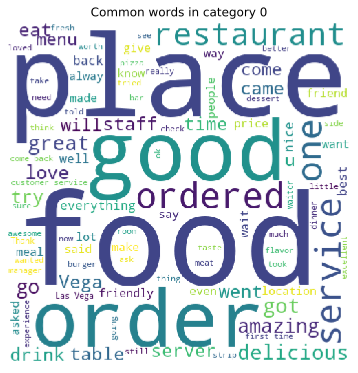

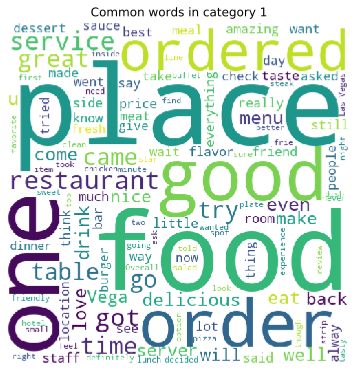

In [22]:
# Initialize the word cloud
wc = WordCloud(width = 500, height = 500, min_font_size = 10, background_color ='white')

# 2018
for i in range(2):
    cate = df[df['label'] == i]['text'].str.cat(sep=' ')
    cate_wc = wc.generate(cate)
    
    # plot
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(cate_wc) 
    plt.axis("off") 
    plt.title("Common words in category {}".format(i))
    plt.tight_layout(pad = 0) 
    plt.show() 

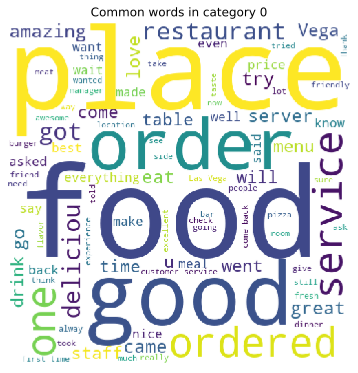

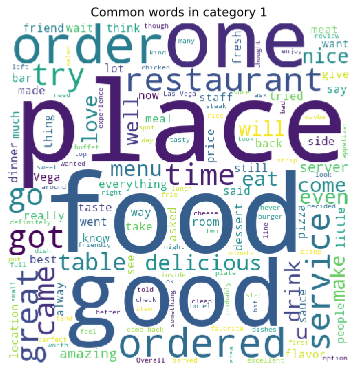

In [23]:
# 2019
for i in range(2):
    cate1 = df_19[df_19['label'] == i]['text'].str.cat(sep=' ')
    cate_wc1 = wc.generate(cate1)
    
    # plot
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(cate_wc1) 
    plt.axis("off") 
    plt.title("Common words in category {}".format(i))
    plt.tight_layout(pad = 0) 
    plt.show() 

## Text Variables - POS Tagging

The POS tagger in the NLTK library outputs specific tags for certain words. The list of POS tags is as follows, with examples of what each POS stands for.
- CC coordinating conjunction
- CD cardinal digit
- DT determiner
- EX existential there (like: “there is” … think of it like “there exists”)
- FW foreign word
- IN preposition/subordinating conjunction
- JJ adjective ‘big’
- JJR adjective, comparative ‘bigger’
- JJS adjective, superlative ‘biggest’
- LS list marker 1)
- MD modal could, will
- NN noun, singular ‘desk’
- NNS noun plural ‘desks’
- NNP proper noun, singular ‘Harrison’
- NNPS proper noun, plural ‘Americans’
- PDT predeterminer ‘all the kids’
- POS possessive ending parent’s
- PRP personal pronoun I, he, she
- PRP$ possessive pronoun my, his, hers
- RB adverb very, silently,
- RBR adverb, comparative better
- RBS adverb, superlative best
- RP particle give up
- TO, to go ‘to’ the store.
- UH interjection, errrrrrrrm
- VB verb, base form take
- VBD verb, past tense took
- VBG verb, gerund/present participle taking
- VBN verb, past participle taken
- VBP verb, sing. present, non-3d take
- VBZ verb, 3rd person sing. present takes
- WDT wh-determiner which
- WP wh-pronoun who, what
- WP$ possessive wh-pronoun whose
- WRB wh-abverb where, when

In [7]:
# Text Stats Features
import nltk
# nltk.download('punkt')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('maxent_ne_chunker')
# nltk.download('words')
# nltk.download('tagsets')
# Part of speech tagging
POS = ['D','V','J','R','N']
def density(df):
    sentence = df['text']
    tagged_sentence = nltk.pos_tag(nltk.word_tokenize(sentence))
    count_dict = dict.fromkeys(POS, 0)
    for i in tagged_sentence:
        (_, k) = i
        tmp = k[0]
        if tmp in POS:
            count_dict[tmp] += 1
    DT = count_dict['D']/len(tagged_sentence) # DT
    VERB = count_dict['V']/len(tagged_sentence) # Start with V
    ADJ = count_dict['J']/len(tagged_sentence) # Start with J
    ADV = count_dict['R']/len(tagged_sentence) # Start with R
    NOUN = count_dict['N']/len(tagged_sentence) # Start with N
    return DT, VERB, ADJ, ADV, NOUN

In [8]:
tag = ['DT','verb','adj','adv','noun']
df[tag] = df.apply(density, axis=1, result_type="expand")
df_19[tag] = df_19.apply(density, axis=1, result_type="expand")

# df['DT'], df['verb'], df['adj'], df['adv'], df['noun'] =  zip(*df['text'].apply(density))
# df_19['DT'], df_19['verb'], df_19['adj'], df_19['adv'], df_19['noun'] =  zip(*df_19['text'].apply(density))

In [10]:
# Ordinal / Quantitative EDA
fig, axs = plt.subplots(2, 5, figsize=(12,6))

axs[0, 0].boxplot(df[df['label']==1].DT)
axs[0, 0].set_title('determiner | High Quality')

axs[0, 1].boxplot(df[df['label']==1].verb)
axs[0, 1].set_title('Verb | High Quality')

axs[0, 2].boxplot(df[df['label']==1].adj)
axs[0, 2].set_title('Adj | High Quality')

axs[0, 3].boxplot(df[df['label']==1].adv)
axs[0, 3].set_title('Adv | High Quality')

axs[0, 4].boxplot(df[df['label']==1].noun)
axs[0, 4].set_title('Noun | High Quality')

axs[1, 0].boxplot(df[df['label']==0].DT)
axs[1, 0].set_title('determiner | Low Quality')

axs[1, 1].boxplot(df[df['label']==0].verb)
axs[1, 1].set_title('Verb | Low Quality')

axs[1, 2].boxplot(df[df['label']==0].adj)
axs[1, 2].set_title('Adj | Low Quality')

axs[1, 3].boxplot(df[df['label']==0].adv)
axs[1, 3].set_title('Adv | Low Quality')

axs[1, 4].boxplot(df[df['label']==0].noun)
axs[1, 4].set_title('Noun | Low Quality')

Text(0.5, 1.0, 'Noun | Low Quality')

## Text Variables - Sentiment

In [13]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.downloader.download('vader_lexicon')
nltk.download('punkt')

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import WordPunctTokenizer
# from bs4 import BeautifulSoup

from nltk.tokenize import WordPunctTokenizer

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/lingyun.wu/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/lingyun.wu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [14]:
def get_tweet_sentiment(text):
    
    tokenized_text = nltk.word_tokenize(text)
    analyzer = SentimentIntensityAnalyzer()
    
    pos_word_list=[]
    neu_word_list=[]
    neg_word_list=[]
    
    for word in tokenized_text:
            score = analyzer.polarity_scores(word)['compound']
        
            if score >= 0.1:
                pos_word_list.append((word, score))
            elif score <= -0.1:
                neg_word_list.append((word, score))
            else:
                neu_word_list.append((word_tokenize, score))
                
    return analyzer.polarity_scores(text)['compound']   

In [ ]:
### Here illustrate how to get sentiment score. Sentiment Score was alr outputed to csv. 
scores = []
for i in list(df['text']):
    scores.append(get_tweet_sentiment(i))

In [15]:
df['sentiment'] = sentiment_18['text_sentiment']
df_19['sentiment'] = sentiment_19['text_sentiment']

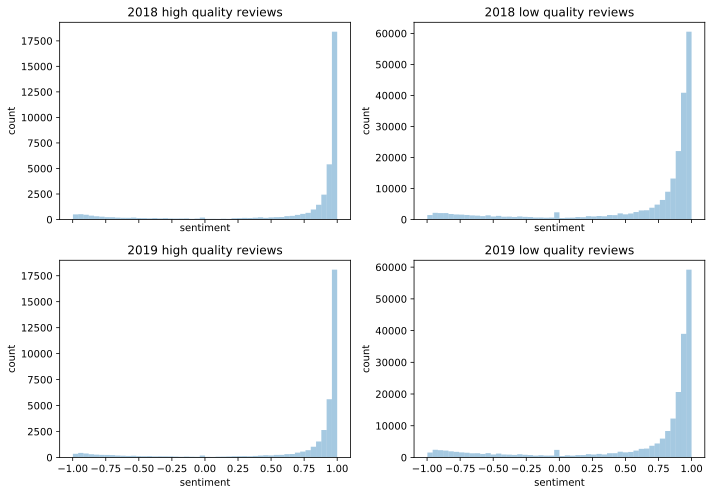

In [17]:
f, axes = plt.subplots(2, 2, figsize=(10, 7), sharex=True, sharey=False)
ax1 = sns.distplot(df[df['label']==1]['sentiment'], kde=False, ax=axes[0, 0])
ax1.set_title('2018 high quality reviews')
ax1.set_ylabel('count')

ax2 = sns.distplot(df_19[df_19['label']==1]['sentiment'], kde=False, ax=axes[1, 0])
ax2.set_title('2019 high quality reviews')
ax2.set_ylabel('count')

ax3 = sns.distplot(df[df['label']==0]['sentiment'], kde=False, ax=axes[0, 1])
ax3.set_title('2018 low quality reviews')
ax3.set_ylabel('count')

ax4 = sns.distplot(df_19[df_19['label']==0]['sentiment'], kde=False, ax=axes[1, 1])
ax4.set_title('2019 low quality reviews')
ax4.set_ylabel('count')

plt.tight_layout()

## Categorical Variables - Categories 

In [24]:
list = {}
for i in df['categories']:
    for j in i.split(', '):
        if j in list:
            list[j] += 1
        else:
            list[j] = 1

In [25]:
def count_cat(text):
    c = len(text.split(', '))
    return c
df['cat_count'] = df['categories'].apply(count_cat)
df_19['cat_count'] = df_19['categories'].apply(count_cat)


In [26]:
vectorizer_categories = CountVectorizer(min_df = 250, tokenizer = lambda x: x.split(', '))
vectorized_categories = vectorizer_categories.fit_transform(df['categories'])

In [27]:
# when min_df = 250, there's 184 key categories. 
# when min_df = 100, there's 240 key categories.
vectorized_categories

<254313x184 sparse matrix of type '<class 'numpy.int64'>'
	with 1381062 stored elements in Compressed Sparse Row format>

In [28]:
' | '.join(vectorizer_categories.get_feature_names())

'acai bowls | active life | african | american (new) | american (traditional) | amusement parks | arcades | arts & entertainment | asian fusion | automotive | bagels | bakeries | barbeque | bars | beauty & spas | beer | beer bar | beer garden | beer gardens | brasseries | brazilian | breakfast & brunch | breweries | british | bubble tea | buffets | burgers | butcher | cafes | cajun/creole | candy stores | cantonese | car wash | caribbean | casinos | caterers | cheesesteaks | chicken shop | chicken wings | chinese | chocolatiers & shops | cinema | cocktail bars | coffee & tea | coffee roasteries | comfort food | conveyor belt sushi | creperies | cuban | cupcakes | custom cakes | dance clubs | day spas | delis | desserts | dim sum | diners | dive bars | do-it-yourself food | donuts | employment agencies | ethnic food | ethnic grocery | event planning & services | farmers market | fashion | fast food | filipino | fish & chips | flowers & gifts | fondue | food | food court | food delivery 

## Text cleaning

In [29]:
import re

# from bs4 import BeautifulSoup
import string

import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('punkt')

# import spacy
# sp = spacy.load('en_core_web_sm')
# spacy_stopwords = sp.Defaults.stop_words

tokenizer = RegexpTokenizer(r'\w+')
wordnet = WordNetLemmatizer()

def text_clean(s):
    # s = BeautifulSoup(s).get_text() 
    s = re.sub('http[s]?://\S+', '', s)
    # s = re.sub(r'[0-9]', '', s) # delete numbers from text
    s_tokens = word_tokenize(s)
    s = " ".join([wordnet.lemmatize(w, pos="v") for w in s_tokens])
    s = "".join([c for c in s if c not in string.punctuation]).lower()
    # s = " ".join(t for t in s.split() if t not in custom)
    return s

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/lingyun.wu/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/lingyun.wu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [30]:
df['text'] = df['text'].apply(text_clean)
df_19['text'] = df_19['text'].apply(text_clean)

In [31]:
df['text'][0]

'ummm  i have no idea why there be so much hate for my favorite taco shop ever  but i m here to tell you that 1  i m super stoke this location open with a drivethru and 2  roberto s taco shop be good af  let me start by say that no one make better tacos than i can at home  haha  confident  yes  i m a damn good cook  but when in vegas  i go to roberto s  their shred chicken and beef tacos be dope  the way they fry those shell  it have inspire how i cook tacos now at home  they re so crunchy and although the meat be tender  your shell be never soggy when you get it home to eat  and the toppings be super simple  just cheese and lettuce  normally i load up my tacos with toppings  but never at roberto s  they re perfect the way they be  with the exception of add their red or green chili sauce  yum  secondly  i m a huge fan of their refried bean  i usually just get a bean and cheese burrito to share with my man  and it s so damn good  but i ve also just order a side of bean  which be so so g

In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 254313 entries, 0 to 254312
Data columns (total 62 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Unnamed: 0           254313 non-null  int64  
 1   Unnamed: 0.1         254313 non-null  int64  
 2   Unnamed: 0.1.1       254313 non-null  int64  
 3   Unnamed: 0_x         254313 non-null  int64  
 4   review_id            254313 non-null  object 
 5   user_id              254313 non-null  object 
 6   business_id          254313 non-null  object 
 7   stars_r              254313 non-null  int64  
 8   useful_r             254313 non-null  int64  
 9   funny_r              254313 non-null  int64  
 10  cool_r               254313 non-null  float64
 11  text                 254313 non-null  object 
 12  date                 254313 non-null  object 
 13  Unnamed: 0_y         254313 non-null  float64
 14  name_b               254313 non-null  object 
 15  address          

In [33]:
feature = ['stars_r', 'latitude',
       'longitude',
       'stars_b', 'review_count_b','funny_u',
       'review_count_u', 'compliment_hot', 'compliment_funny',
       'compliment_plain','fans','compliment_photos', 'compliment_profile',
       'useful_u', 'average_stars', 'cool_u',
       'compliment_cute', 'compliment_cool',
       'compliment_list', 'compliment_writer', 'compliment_more',
       'compliment_note','yelping_since_month','elite_u', 'elite_count',
       'text_length','text_count','cat_count',
       'DT', 'verb', 'adj', 'adv', 'noun','sentiment']
nontext_feature = ['stars_r', 'latitude',
       'longitude',
       'stars_b', 'review_count_b','funny_u',
       'review_count_u', 'compliment_hot', 'compliment_funny',
       'compliment_plain','fans','compliment_photos', 'compliment_profile',
       'useful_u', 'average_stars', 'cool_u',
       'compliment_cute', 'compliment_cool',
       'compliment_list', 'compliment_writer', 'compliment_more',
       'compliment_note','yelping_since_month','elite_u','elite_count','cat_count']

In [34]:
df.to_csv('processed_18.csv')
df_19.to_csv('processed_19.csv')

In [35]:
train_set = df
test_set = df_19
del df
del df_19

In [37]:
y_train = train_set['label']
y_test = test_set['label']

In [38]:
scaler_nontext = preprocessing.StandardScaler().fit(train_set[nontext_feature])
X_train_nontext = scaler_nontext.transform(train_set[nontext_feature])
X_test_nontext = scaler_nontext.transform(test_set[nontext_feature])

In [39]:
  scaler = preprocessing.StandardScaler().fit(train_set[feature])
  X_train_pre = scaler.transform(train_set[feature])
  X_test_pre = scaler.transform(test_set[feature])

In [40]:
import scipy as sp
vectorizer_categories = CountVectorizer(min_df = 250, tokenizer = lambda x: x.split(', '))
categories_18 = vectorizer_categories.fit_transform(train_set['categories'])
categories_19 = vectorizer_categories.transform(test_set['categories'])

vector_text = CountVectorizer()

X_train_text = sp.sparse.hstack(
    (categories_18,
    vector_text.fit_transform(train_set['text']),
    X_train_pre.astype(float)),format='csr')

X_test_text = sp.sparse.hstack(
    (categories_19,
    vector_text.transform(test_set['text']),
    X_test_pre.astype(float)),format='csr')

In [41]:
tfidf = TfidfVectorizer()
X_train_tfidf = sp.sparse.hstack(
    (categories_18,
    tfidf.fit_transform(train_set['text']),
    X_train_pre.astype(float)),format='csr')

X_test_tfidf = sp.sparse.hstack(
    (categories_19,
    tfidf.transform(test_set['text']),
    X_test_pre.astype(float)),format='csr')

In [42]:
X_train_cat = sp.sparse.hstack(
    (X_train_pre.astype(float),
    categories_18),format='csr')

X_test_cat = sp.sparse.hstack(
    (X_test_pre.astype(float),
    categories_19),format='csr')
X_train_cat

<254313x218 sparse matrix of type '<class 'numpy.float64'>'
	with 10027704 stored elements in Compressed Sparse Row format>

In [43]:
### Sampling
# 1. Smote
oversample = SMOTE()
X_train_pre_smote, y_train_smote = oversample.fit_resample(X_train_pre, y_train)
print(Counter(y_train_smote))

randomover = RandomOverSampler()
X_train_pre_randomover, y_train_randomover = randomover.fit_resample(X_train_pre, y_train)
print(Counter(y_train_randomover))

randomunder = RandomUnderSampler()
X_train_pre_randomunder, y_train_randomunder = randomunder.fit_resample(X_train_pre, y_train)
print(Counter(y_train_randomunder))


Counter({1: 216034, 0: 216034})
Counter({1: 216034, 0: 216034})
Counter({0: 38279, 1: 38279})


## Define Functions

In [44]:
def evaluation(y_true, y_pred, probs):
    print('Confusion Matrix: '+'\n',metrics.confusion_matrix(y_true, y_pred))
    print('Accuracy: ', metrics.accuracy_score(y_true, y_pred))
    print(metrics.classification_report(y_true, y_pred))
    roc_auc = metrics.roc_auc_score(y_true, probs[:,1])
    print('AUC: ', roc_auc)

In [45]:
# def fit_evaluate(model, X, y, x_test, y_true):
def fit_evaluate(model, X, y, x_test, y_true, output='yes'):
    model.fit(X,y)
    y_pred = model.predict(x_test)
    prob = model.predict_proba(x_test)
    
    print('Confusion Matrix: \n', metrics.confusion_matrix(y_true, y_pred))
    acc = metrics.accuracy_score(y_true, y_pred)
    precision = metrics.precision_score(y_true, y_pred)
    recall = metrics.recall_score(y_true, y_pred)
    f1 = metrics.f1_score(y_true, y_pred)
    print('Accuracy: ', metrics.accuracy_score(y_true, y_pred))
    print(metrics.classification_report(y_true, y_pred))
    roc_auc = metrics.roc_auc_score(y_true, prob[:,1])
    print("AUC:", roc_auc)
    if output == 'yes':
        return y_pred, prob, acc, precision, recall, f1, roc_auc
    else:
        return None

In [46]:
def cross_val(model, parameter, X, y):
    tuned = GridSearchCV(model, parameter, verbose=2)
    tuned.fit(X,y)
    print("Best score: {:.2%}".format(tuned.best_score_))
    print("Best Hyperparameters:{}".format(tuned.best_params_))  

# Model

## NB Bag of words

In [47]:
import scipy as sp
nb = MultinomialNB()
vect = CountVectorizer()
pipe = make_pipeline(vect, nb)

param_grid = {}
param_grid['countvectorizer__token_pattern'] = [r"\b\w\w+\b", r"'([a-z ]+)'",r"(?u)\b\w\w+\b"]
param_grid['countvectorizer__min_df'] = [1, 3, 5, 7]
param_grid['multinomialnb__alpha'] = sp.stats.uniform(scale=1)
param_grid

{'countvectorizer__token_pattern': ['\\b\\w\\w+\\b',
  "'([a-z ]+)'",
  '(?u)\\b\\w\\w+\\b'],
 'countvectorizer__min_df': [1, 3, 5, 7],
 'multinomialnb__alpha': <scipy.stats._distn_infrastructure.rv_frozen at 0x7f9d3690a640>}

In [48]:
rand = RandomizedSearchCV(pipe, param_grid, cv=5, scoring='roc_auc', n_iter=5, random_state=1)

In [49]:
%time rand.fit(train_set['text'], train_set['label'])
print(rand.best_score_)
print(rand.best_params_)

CPU times: user 3min 35s, sys: 4.4 s, total: 3min 39s
Wall time: 3min 40s
0.6688484275800859
{'countvectorizer__min_df': 5, 'countvectorizer__token_pattern': '\\b\\w\\w+\\b', 'multinomialnb__alpha': 0.4191945144032948}


In [50]:
y_rand = rand.predict(test_set['text'])
print('Accuracy: ', metrics.accuracy_score(y_test, y_rand))
print(metrics.classification_report(y_test, y_rand))

Accuracy:  0.8051117822816379
              precision    recall  f1-score   support

           0       0.89      0.88      0.88    209015
           1       0.37      0.39      0.38     37983

    accuracy                           0.81    246998
   macro avg       0.63      0.63      0.63    246998
weighted avg       0.81      0.81      0.81    246998



In [51]:
nb_2 = make_pipeline(CountVectorizer(min_df=5, token_pattern = '\\b\\w\\w+\\b'), MultinomialNB(alpha= 0.4191945144032948))
pred_nb, prob_nb, acc_nb, precision_nb, recall_nb, f1_nb, auc_nb = fit_evaluate(nb_2,train_set['text'], train_set['label'],test_set['text'],test_set['label'])

Confusion Matrix: 
 [[184179  24836]
 [ 23301  14682]]
Accuracy:  0.8051117822816379
              precision    recall  f1-score   support

           0       0.89      0.88      0.88    209015
           1       0.37      0.39      0.38     37983

    accuracy                           0.81    246998
   macro avg       0.63      0.63      0.63    246998
weighted avg       0.81      0.81      0.81    246998

AUC: 0.6712144271966768


## XGB | Nontext data

In [52]:
xgb_nontext = XGBClassifier(random_state=0)
pred_nontext, prob_nontext, acc_nontext, precision_nontext, recall_nontext, f1_nontext, auc_nontext = fit_evaluate(xgb_nontext,X_train_nontext,y_train,X_test_nontext,y_test)

[00:39:02] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[205115   3900]
 [ 22386  15597]]
Accuracy:  0.8935780856525154
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.80      0.41      0.54     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.70      0.74    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.8991245081446166


In [53]:
nontext_parameters = {
        'n_estimators': [10, 20, 50, 100],
        }
cross_val(xgb_nontext, nontext_parameters, X_train_nontext, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[00:39:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV] END ....................................n_estimators=10; total time=   1.2s
[00:39:25] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV] END ....................................n_estimators=10; total time=   1.1s
[00:39:26] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

In [54]:
xgb_nontext_new = XGBClassifier(random_state=0, n_estimators = 10)
fit_evaluate(xgb_nontext_new,X_train_nontext,y_train,X_test_nontext,y_test,output='no')

[00:41:07] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[206317   2698]
 [ 24158  13825]]
Accuracy:  0.8912703746589041
              precision    recall  f1-score   support

           0       0.90      0.99      0.94    209015
           1       0.84      0.36      0.51     37983

    accuracy                           0.89    246998
   macro avg       0.87      0.68      0.72    246998
weighted avg       0.89      0.89      0.87    246998

AUC: 0.8899466616504789


XGB Text Stats features + Nontext features

In [55]:
xgb_pre = XGBClassifier(random_state=0)
pred_pre, prob_pre, acc_pre, precision_pre, recall_pre, f1_pre, auc_pre = fit_evaluate(xgb_pre,X_train_pre,y_train,X_test_pre,y_test)

[00:41:17] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204714   4301]
 [ 21736  16247]]
Accuracy:  0.8945861909813035
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.79      0.43      0.56     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.70      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.9018975028626168


In [56]:
pre_parameters = {
        'n_estimators': [10, 30, 50, 80, 100, 150]
        }
cross_val(xgb_pre, pre_parameters, X_train_pre, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[00:41:33] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV] END ....................................n_estimators=10; total time=   1.4s
[00:41:35] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[CV] END ....................................n_estimators=10; total time=   1.3s
[00:41:36] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Ex

In [57]:
xgb_pre_new = XGBClassifier(random_state=0, n_estimators = 10)
fit_evaluate(xgb_pre_new,X_train_pre,y_train,X_test_pre,y_test,output='no')

[00:47:14] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[206246   2769]
 [ 23774  14209]]
Accuracy:  0.8925375913975012
              precision    recall  f1-score   support

           0       0.90      0.99      0.94    209015
           1       0.84      0.37      0.52     37983

    accuracy                           0.89    246998
   macro avg       0.87      0.68      0.73    246998
weighted avg       0.89      0.89      0.87    246998

AUC: 0.8935321912461844


## XGB | nonText + Text Status + Categories

In [58]:
# Plus Categories feature
xgb_cat = XGBClassifier(random_state=0)
pred_cat, prob_cat, acc_cat, precision_cat, recall_cat, f1_cat, auc_cat = fit_evaluate(xgb_cat,X_train_cat,y_train,X_test_cat,y_test)

[00:47:52] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204546   4469]
 [ 21580  16403]]
Accuracy:  0.8945376075919643
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.79      0.43      0.56     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.71      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.9034704659764514


## XGB | nonText + Text Status + Categories + review text (bag of words & TFIDF)

In [59]:
# Plus review text bag of words
xgb_text = XGBClassifier(random_state=0)
pred_text, prob_text, acc_text, precision_text, recall_text, f1_text, auc_text = fit_evaluate(xgb_text,X_train_text,y_train,X_test_text,y_test)

[00:48:41] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204686   4329]
 [ 21811  16172]]
Accuracy:  0.8941691835561422
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.79      0.43      0.55     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.70      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.903623585504857


In [60]:
xgb_tfidf = XGBClassifier(random_state=0)
pred_tfidf, prob_tfidf, acc_tfidf, precision_tfidf, recall_tfidf, f1_tfidf, auc_tfidf = fit_evaluate(xgb_tfidf,X_train_tfidf,y_train,X_test_tfidf,y_test)

[00:50:54] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204790   4225]
 [ 21897  16086]]
Accuracy:  0.8942420586401509
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.79      0.42      0.55     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.70      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.9018364216839803


Sampling

In [61]:
xgb_smote = XGBClassifier(random_state=0)
pred_smote, prob_smote, acc_smote, precision_smote, recall_smote, f1_smote, auc_smote = fit_evaluate(xgb_smote,X_train_pre_smote,y_train_smote,X_test_pre,y_test)

[01:07:55] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204229   4786]
 [ 21354  16629]]
Accuracy:  0.8941691835561422
              precision    recall  f1-score   support

           0       0.91      0.98      0.94    209015
           1       0.78      0.44      0.56     37983

    accuracy                           0.89    246998
   macro avg       0.84      0.71      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.9004669403175569


In [62]:
xgb_randomover = XGBClassifier(random_state=0)
pred_randomover, prob_randomover, acc_randomover, precision_randomover, recall_randomover, f1_randomover, auc_randomover = fit_evaluate(xgb_randomover,X_train_pre_randomover,y_train_randomover,X_test_pre,y_test)

[01:08:33] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[180566  28449]
 [  9987  27996]]
Accuracy:  0.8443874039465906
              precision    recall  f1-score   support

           0       0.95      0.86      0.90    209015
           1       0.50      0.74      0.59     37983

    accuracy                           0.84    246998
   macro avg       0.72      0.80      0.75    246998
weighted avg       0.88      0.84      0.86    246998

AUC: 0.9009919226464611


In [63]:
xgb_randomunder = XGBClassifier(random_state=0)
pred_randomunder, prob_randomunder, acc_randomunder, precision_randomunder, recall_randomunder, f1_randomunder, auc_randomunder = fit_evaluate(xgb_randomunder,X_train_pre_randomunder,y_train_randomunder,X_test_pre,y_test)

[01:08:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[176105  32910]
 [  8965  29018]]
Accuracy:  0.830464214285136
              precision    recall  f1-score   support

           0       0.95      0.84      0.89    209015
           1       0.47      0.76      0.58     37983

    accuracy                           0.83    246998
   macro avg       0.71      0.80      0.74    246998
weighted avg       0.88      0.83      0.85    246998

AUC: 0.9000455404002299


In [64]:
xgb_cat = XGBClassifier(random_state=0)
xgb_cat.fit(X_train_cat,y_train)
import shap
exp = shap.TreeExplainer(xgb_cat)
sv = exp.shap_values(X_test_cat)

[01:09:46] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


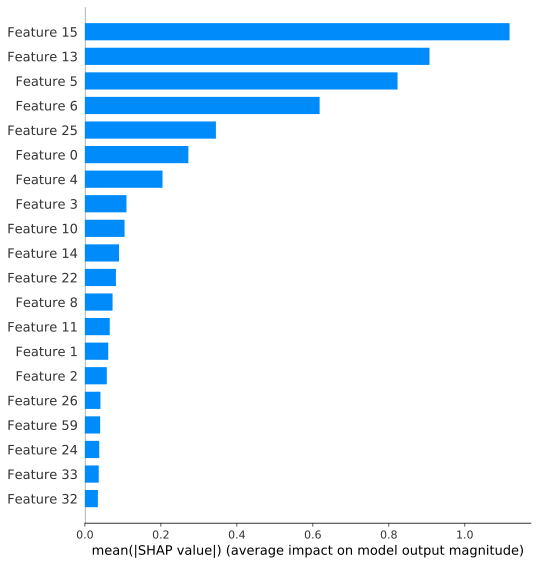

In [65]:
shap.initjs()
shap.summary_plot(sv, X_test_cat, plot_type="bar")

In [66]:
important_feature = [15,13,5,6,25,0,4,3,10,14,22,8,11,1,2,26,59,24,33,32]
xgb_test = XGBClassifier(random_state=0)
pred_top, prob_top, acc_top, precision_top, recall_top, f1_top, auc_top = fit_evaluate(xgb_test,X_train_cat[:,important_feature],y_train,X_test_cat[:,important_feature],y_test)

[01:23:15] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Confusion Matrix: 
 [[204683   4332]
 [ 21639  16344]]
Accuracy:  0.894853399622669
              precision    recall  f1-score   support

           0       0.90      0.98      0.94    209015
           1       0.79      0.43      0.56     37983

    accuracy                           0.89    246998
   macro avg       0.85      0.70      0.75    246998
weighted avg       0.89      0.89      0.88    246998

AUC: 0.9031818646831686


Evaluation

In [67]:
# Define dataframe to store results
evaluation = pd.DataFrame(columns=['Accuracy', 'ROC', 'Precision', 'Recall', 'F1-score'],index=['nb','nontext','pre','smote','randomover','randomunder','cat','text','tfidf','top'])
features=['nb','nontext','pre','smote','randomover','randomunder','cat','text','tfidf','top']
for fea in features:
     evaluation.loc[fea] = [globals()["acc_"+fea], globals()["auc_"+fea], globals()["precision_"+fea],globals()["recall_"+fea],globals()["f1_"+fea]] 

In [68]:
evaluation

,Accuracy,ROC,Precision,Recall,F1-score
nb,0.805112,0.671214,0.371527,0.386541,0.378885
nontext,0.893578,0.899125,0.799969,0.410631,0.542693
pre,0.894586,0.901898,0.790685,0.427744,0.555159
smote,0.894169,0.900467,0.776512,0.437801,0.559918
randomover,0.844387,0.900992,0.495987,0.737067,0.59296
randomunder,0.830464,0.900046,0.468576,0.763973,0.580877
cat,0.894538,0.90347,0.785885,0.431851,0.557404
text,0.894169,0.903624,0.78884,0.425769,0.55304
tfidf,0.894242,0.901836,0.791985,0.423505,0.551892
top,0.894853,0.903182,0.790482,0.430298,0.557255


In [69]:
feature.append('label')

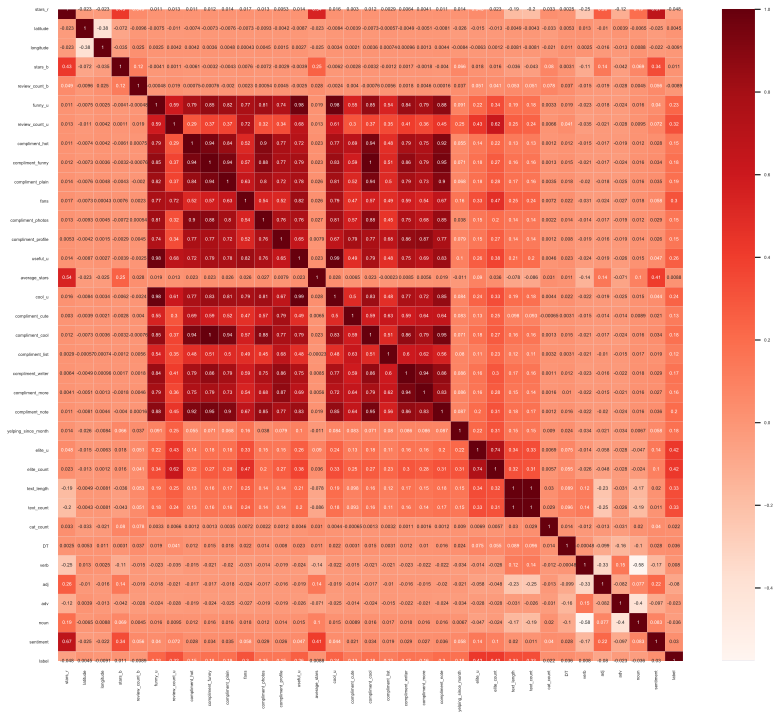

In [74]:
plt.figure(figsize=(14,12))
cor = train_set[feature].corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
sns.set(font_scale=0.6)
plt.show()

In [73]:
cor['label']

stars_r               -0.048058
latitude               0.004530
longitude             -0.009108
stars_b                0.010679
review_count_b        -0.008942
funny_u                0.225442
review_count_u         0.317657
compliment_hot         0.148351
compliment_funny       0.180476
compliment_plain       0.185912
fans                   0.304930
compliment_photos      0.151482
compliment_profile     0.153288
useful_u               0.255835
average_stars          0.008788
cool_u                 0.238515
compliment_cute        0.130140
compliment_cool        0.180476
compliment_list        0.115836
compliment_writer      0.167884
compliment_more        0.162146
compliment_note        0.201317
yelping_since_month    0.177034
elite_u                0.423194
elite_count            0.422424
text_length            0.334015
text_count             0.329688
cat_count              0.021774
DT                     0.036289
verb                   0.008033
adj                   -0.080359
adv     